In [1]:
from wordcloud import WordCloud
import pandas as pd
import numpy as np
from nltk.tokenize import TweetTokenizer
from PIL import Image
from os import path
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# load the data
email_folder = "hillary-clinton-emails/"
df = pd.read_csv(email_folder +'Emails.csv', index_col=0)
df.head(3)

,DocNumber,MetadataSubject,MetadataTo,MetadataFrom,SenderPersonId,MetadataDateSent,MetadataDateReleased,MetadataPdfLink,MetadataCaseNumber,MetadataDocumentClass,...,ExtractedTo,ExtractedFrom,ExtractedCc,ExtractedDateSent,ExtractedCaseNumber,ExtractedDocNumber,ExtractedDateReleased,ExtractedReleaseInPartOrFull,ExtractedBodyText,RawText
Id,,,,,,,,,,,,,,,,,,,,,
1,C05739545,WOW,H,"Sullivan, Jacob J",87.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739545...,F-2015-04841,HRC_Email_296,...,NaN,"Sullivan, Jacob J <Sullivan11@state.gov>",NaN,"Wednesday, September 12, 2012 10:16 AM",F-2015-04841,C05739545,05/13/2015,RELEASE IN FULL,NaN,UNCLASSIFIED\nU.S. Department of State\nCase N...
2,C05739546,H: LATEST: HOW SYRIA IS AIDING QADDAFI AND MOR...,H,NaN,NaN,2011-03-03T05:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH1/DOC_0C05739546...,F-2015-04841,HRC_Email_296,...,NaN,NaN,NaN,NaN,F-2015-04841,C05739546,05/13/2015,RELEASE IN PART,"B6\nThursday, March 3, 2011 9:45 PM\nH: Latest...",UNCLASSIFIED\nU.S. Department of State\nCase N...
3,C05739547,CHRIS STEVENS,;H,"Mills, Cheryl D",32.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739547...,F-2015-04841,HRC_Email_296,...,B6,"Mills, Cheryl D <MillsCD@state.gov>","Abedin, Huma","Wednesday, September 12, 2012 11:52 AM",F-2015-04841,C05739547,05/14/2015,RELEASE IN PART,Thx,UNCLASSIFIED\nU.S. Department of State\nCase N...


In [3]:
allRawEmails = df.RawText.str.cat()

# Question 1: Wordclouds
### Raw corpus, all stopwords included
First thing first lets do a quick wordcloud on the raw data (as asked) to put an emphasis on the state of the corpus we have to work on, we chose to disable the built-in feature of our WordCloud library which automatically removes all stop words (of, the, that, and, ..).

In [4]:
# By default wordcloud already does NLP preprocessing that's why we have to disable its stopword removal feature
wordcloud = WordCloud(width=1000, height=400, stopwords=[""]).generate(allRawEmails)

In [5]:
def show_cloud(wordcld, height=100, width=100):
    plt.figure(figsize=(height, width))
    plt.imshow(wordcld)
    plt.axis("off")
    plt.show()

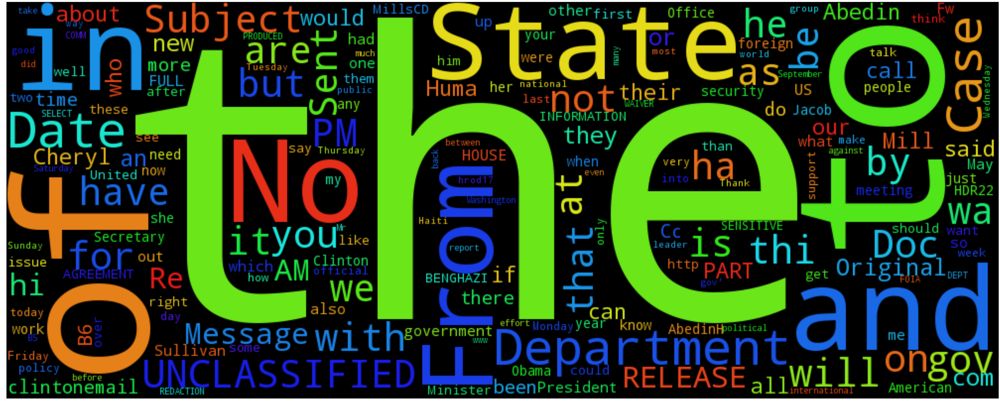

In [6]:
show_cloud(wordcloud, width=33)

As expected the most present words/tokens are the stop words, which is not really interesting unless you'd want to learn about the writers habits, this is why our Wordcloud library is shipped with that functionality.
## Interesting fields, no stop words included
As wordclouds already aren't a scientific measurment, the next wordclouds will be shaped as the democratic donkey, as it's highly relevant.

The following word cloud is already much more interesting now that the "0 enthropy" words are gone.
This means no more english stopwords and we only look at the subjects and extracted email bodies instead of the raw text!

In [7]:
donkey_mask = np.array(Image.open(path.join(path.dirname('__file__'), "wordcloud-masks/donkey-mask.png")))

def donkeyfier(bg_color, width, height):
    return WordCloud(background_color=bg_color, mask=donkey_mask, width=width, height=height)

In [8]:
donkfr = donkeyfier("white", 1000, 1000)
df = df.fillna("")
df['WantedFields'] = df.apply(lambda x: "{} {} ".format(x.ExtractedSubject, x.ExtractedBodyText), axis=1)
allInfos = df.WantedFields.str.cat()
donkfr.generate(allInfos)

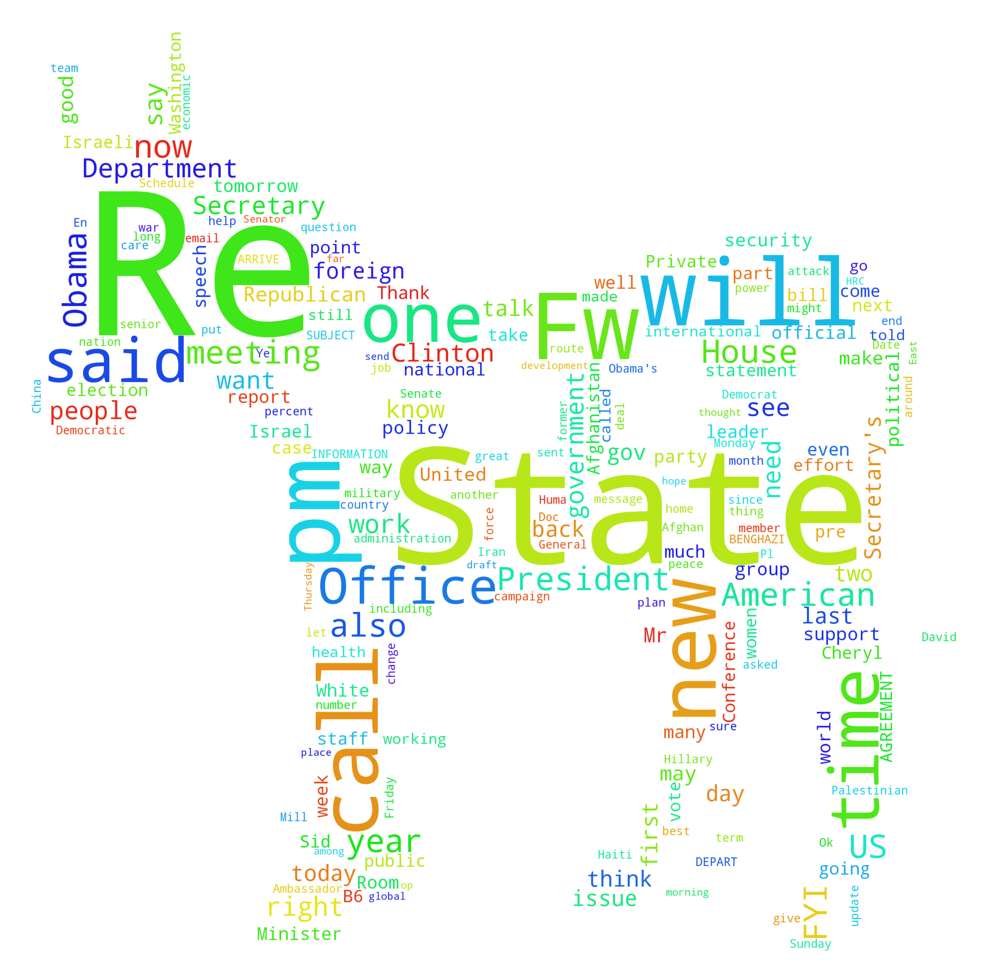

In [9]:
show_cloud(donkfr)

### Now with some NLP preprocessing sprinkled on top of it

We will first tokenize our input.

In [10]:
from nltk.tokenize import RegexpTokenizer

# We already filter the full caps lock words (which are in the emails headers)
# We also tokenize "Depatment of State" as one token, that way we will be able to remove it altogether
# We also allow the diverse abreviations for the United States of America
tokenizer = RegexpTokenizer('Department of State|[a-zA-Z][a-z]+|U.S|U.S.A|USA')
tokenizedText = tokenizer.tokenize(allInfos)

# This is what we get at this point
tokenizedText[0:20]

['Wow',
 'Thursday',
 'March',
 'Latest',
 'How',
 'Syria',
 'is',
 'aiding',
 'Qaddafi',
 'and',
 'more',
 'Sid',
 'hrc',
 'memo',
 'syria',
 'aiding',
 'libya',
 'docx',
 'hrc',
 'memo']

Now we'll not only filter out the english stop words but also "stop" words inherent from the media (emails) e.g. "re", "subject"

In [11]:
# stopwords stripping preparation
from nltk.corpus import stopwords

customStopWords = [
    'Department of State', 'cc', 'Sent', 'To', 'Subject', 'From',
    'No', 'Fw', 'Fwd', 'If', 'hey', 'pm', 'State', 'Re',
    'It', 'we', 'call', 'state', 're', 'us', 
]

allStopWords = set(stopwords.words('english') + customStopWords)

# stemming preparation
from nltk.stem.snowball import EnglishStemmer

snowStemmer = EnglishStemmer(ignore_stopwords=True)


# apply both to our tokens
filteredTokens = [snowStemmer.stem(token) for token in tokenizedText if token not in allStopWords]

You can see that we also applied the stemming in the above cell to avoid doing a second iterations on the tokens.

In [12]:
donkfrStem = donkeyfier("white", 1000, 1000)
donkfrStem.generate(" ".join(filteredTokens))

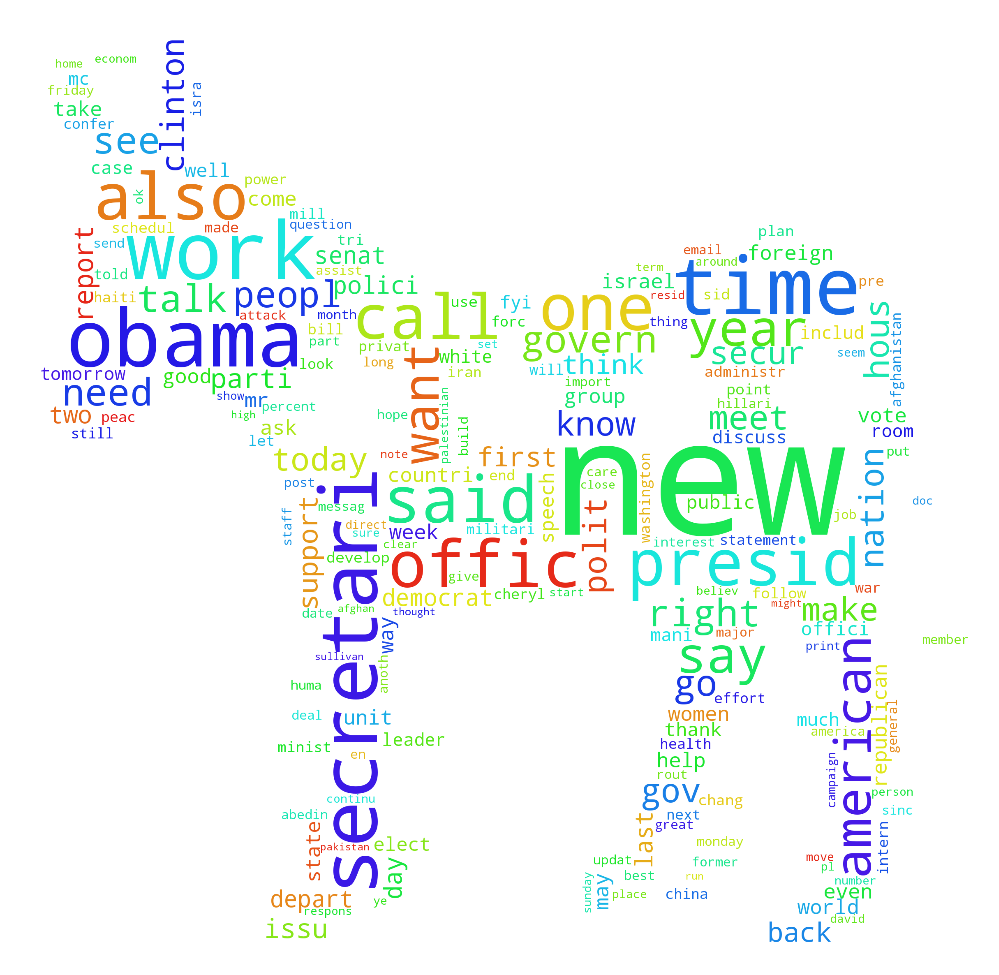

In [13]:
show_cloud(donkfrStem)

In [20]:
# define a tokenize + stemming function based on what we did for Q1
def tAndS(email):
    tokensFromEmail = tokenizer.tokenize(email);
    return [snowStemmer.stem(token) for token in tokensFromEmail if token not in allStopWords]

df['TokenizedText'] = df.WantedFields.apply(tAndS)

To compare the first and last wordclouds, we can see that the first one gives you a better insights at how the emails are syntactically built whereas the last one gives you a good overview of the semantic, what the emails are actually about.

Most of the time, the goals of word clouds are to extract the essence of a discussion, find a trend about what's happenning therefor, we think that the last wordcloud gives us more meaningful insights.

# Question 2: Country enquiry



In [40]:
import pycountry

First, let's isolate emails with countries mentionned in them

In [63]:
allCountries = pycountry.countries
cNames = set([country.name.lower() for country in allCountries] + ['us'])

def lstCountriesInEmail(tokens):
    return set([allCountries.lookup(tkn).name for tkn in tokens if tkn in cNames])

df['Countries'] = df.TokenizedText.apply(lstCountriesInEmail)
withCountries = df[df['Countries'].apply(lambda x: len(x)) > 0]

Now we need to find the sentiment of each emails

In [70]:
from nltk.sentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

In [73]:
# We compute the sentiment of each emails.
df['Sentiment'] = df.TokenizedText.apply(lambda x: analyser.polarity_scores(" ".join(x)))

In [80]:
# We aggregate the sentiments per countries
sentPerCountry = {}

def addSent(country, sentiment):
    if sentPerCountry.get(country) is None:
        sentPerCountry[country] = []
    sentPerCountry[country].append(sentiment['compound'])

# The "_=" is there just to avoid jupyter printing the output of df.apply(...) which we
# do not care about as this apply only does meaningful side effects and no meaningful return
_ = df.apply(lambda x: [addSent(country, x.Sentiment) for country in x.Countries], axis=1)

In [91]:
# We filter out the countries which have less than 20 emails mentionning them
resDict = {}

def aggregateSent(country, sentiments):
    count = len(sentiments)
    sum = 0
    for sent in sentiments:
        sum += sent
    resDict[country] = [sum / count, count]


_ = [ aggregateSent(country, sentiments) for country, sentiments in sentPerCountry.items() if len(sentiments) > 20]

In [143]:
# We build a dataframe with the country as index, a column '0' with the mean compound sentiment
# and a column '1' the number of email mentionning the country.
resDf = pd.DataFrame.from_dict(resDict, orient='index')
resDf = resDf.sort_values(by=0)

In [141]:
# And finally we plot the thing! Sorry if the colormap chosen hurt your eyes, we like pink!
import matplotlib.pyplot as plt
from matplotlib import cm

def plotBarChart(someDf):
    # Heavily inspired from: http://stackoverflow.com/questions/31313606/pyplot-matplotlib-bar-chart-with-fill-color-depending-on-value
    y = np.array(someDf[0])
    colors = cm.spring(y / float(max(y)))
    plt.figure(figsize=(20, 10), dpi=100)
    plot = plt.scatter(y, y, c = y, cmap = 'spring')
    plt.clf()
    bar = plt.colorbar(plot)
    
    plt.bar(range(len(y)), someDf[1], color = colors, tick_label=someDf.index)
    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Country")
    plt.ylabel("Frequency")
    bar.ax.set_title("Sentiment")
    plt.title("Mean sentiment per country mentionned in more than 20 emails")
    plt.show()

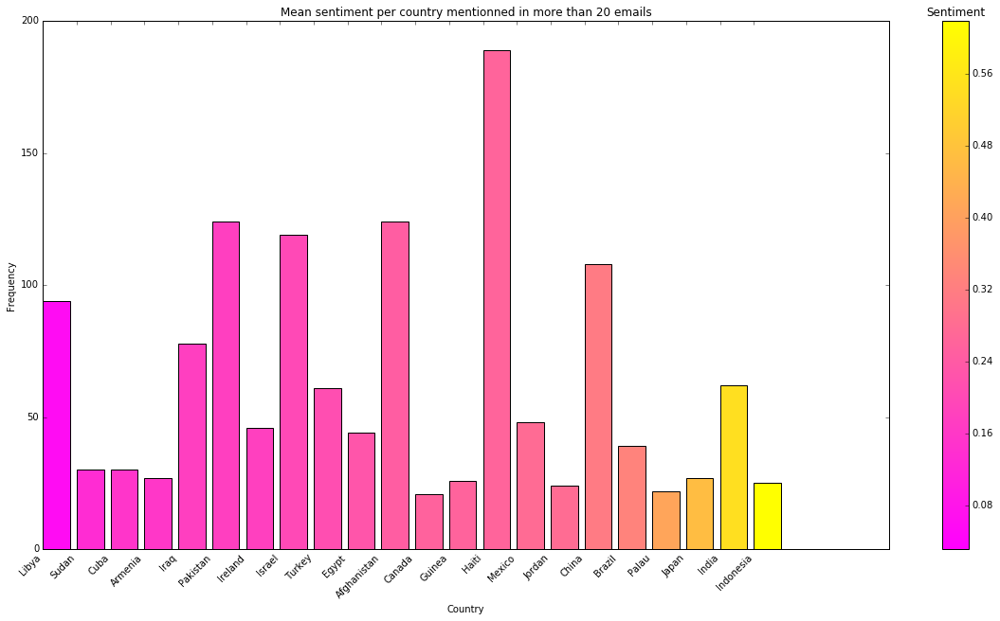

In [142]:
plotBarChart(resDf)

We can observe that no countries are linked to a negative sentiment.

We were not able to find substantial difference with the methods provided in the demo.

# Question 3: Gensim Model

While testing different numbers of topic (between 5 and 50, as requested), we found out that we got more specific topics as we were increasing the number of them up until a point where too many topics get the same words shared between them. This inflexion point occured between around 15 topics (which is the number of topics we settled for as an optimum!)

In [16]:
from gensim import corpora, models

In [21]:
# We build the dict.
dictionary = corpora.Dictionary(df.TokenizedText)

# we build the corpus based on our dictionary
corpus = [dictionary.doc2bow(email) for email in df.TokenizedText]
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics=15, id2word = dictionary, passes=20)

In [36]:
topics = ldamodel.show_topics(num_topics=15, num_words=12, formatted=False)

In [37]:
_ = [print("topic n°{}: {}".format(no, ", ".join([word for word, freq in topic]))) for no, topic in topics]

topic n°0: call, talk, tomorrow, get, want, see, ok, schedul, time, know, work, today
topic n°1: thank, reuter, good, happi, hope, great, best, new, year, see, book, all
topic n°2: the, say, one, mr, like, but, elect, year, would, time, he, two
topic n°3: com, sid, print, gov, clintonemail, hrod, pls, memo, monday, for, sunday, hillari
topic n°4: secretari, offic, room, depart, rout, en, resid, confer, privat, airport, floor, treati
topic n°5: updat, ms, day, oscar, juarez, mexico, nov, quartet, ford, craig, kid, sleep
topic n°6: the, parti, china, minist, would, said, blair, deal, labour, tori, brown, cameron
topic n°7: speech, draft, doc, date, we, case, meet, u., want, thank, work, know
topic n°8: republican, senat, democrat, percent, vote, koch, bill, parti, boehner, hous, care, health
topic n°9: iran, report, china, foreign, think, one, the, right, iranian, say, said, clinton
topic n°10: gov, fyi, mill, cheryl, abedin, huma, sullivan, jacob, friday, wednesday, thursday, saturday
t

# Bonus Question: Graphs and communities

### We implemented a solution to the bonus question on a separate notebook: [this one! (Bonus.ipynb)](Bonus.ipynb)